In [1]:
import umap
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
from matplotlib import rcParams
rcParams['pdf.fonttype'] = 42 # enables correct plotting of text
rcParams['figure.figsize'] = (12,12)

In [3]:
l1_colors = {
'ATL': '#1f77b4',
  'PT_VCAM1': '#c5b0d5',
 'CNT': '#ff7f0e',
 'DCT': '#279e68',
  'DCT1': '#279e68',
 'DCT2': '#ffb500',
 'DTL': '#d62728',
 'EC': '#aa40fc',
 'ENDO': '#aa40fc',
 'FIB': '#8c564b',
 'IC': '#e377c2',
 'ICA': '#e377c2',
 'ICB': '#7b4f4b',
 'IMM': '#b5bd61',
 'LEUK': '#b5bd61',
 'NEU': '#17becf',
 'PC': '#aec7e8',
 'PEC': '#17becf',
 'POD': '#98df8a',
 'PODO': '#98df8a',
'PT': '#ff9896',
 'PapE': '#c5b0d5',
 'TAL': '#c49c94',
'MES': '#f7b6d2',
 'VSM/P': '#f7b6d2','Unclassified':'#d3d3d3'}

In [4]:
l3_colors = {
'ATL': '#ffff00',
 'B': '#1ce6ff',
 'C-TAL': '#ff34ff',
 'PC': '#aec7e8',
 'CCD-IC-A': '#ff4a46',
 'CCD-PC': '#008941',
 'CNT': '#006fa6',
 'CNT-IC-A': '#a30059',
 'CNT-PC': '#ffdbe5',
 'DCT1': '#7a4900',
 'DCT2': '#0000a6',
 'DTL': '#63ffac',
 'EC-AEA': '#b79762',
 'EC-AVR': '#004d43',
 'EC-DVR': '#8fb0ff',
 'EC-GC': '#997d87',
 'EC-LYM': '#5a0007',
 'EC-PTC': '#809693',
 'FIB': '#6a3a4c',
 'IC-B': '#1b4400',
 'IMCD': '#4fc601',
 'M-FIB': '#3b5dff',
 'M-TAL': '#4a3b53',
 'MAC-M2': '#ff2f80',
 'MAST': '#61615a',
 'MC': '#ba0900',
 'MD': '#6b7900',
 'MDC': '#00c2a0',
 'MYOF': '#ffaa92',
 'N': '#ff90c9',
 'NEU': '#b903aa',
 'NKC/T': '#d16100',
 'OMCD-IC-A': '#ddefff',
 'OMCD-PC': '#000035',
 'PEC': '#7b4f4b',
 'PL': '#a1c299',
 'POD': '#300018',
 'PT-S1/2': '#0aa6d8',
 'PT-S3': '#013349',
 'PapE': '#00846f',
 'REN': '#372101',
 'T': '#ffb500',
 'VSMC': '#c2ffed',
 'VSMC/P': '#a079bf',
 'aFIB': '#cc0744',
 'aPT': '#c0b9b2',
 'aTAL1': '#c2ff99',
 'aTAL2': '#001e09',
 'cDC': '#00489c',
 'cycCNT': '#6f0062',
 'cycDCT': '#0cbd66',
 'cycEC': '#eec3ff',
 'cycMNP': '#456d75',
 'cycMYOF': '#b77b68',
 'cycNKC/T': '#7a87a1',
 'cycPT': '#788d66',
 'dC-IC-A': '#885578',
 'dC-TAL': '#fad09f',
 'dCNT': '#ff8a9a',
 'dDCT': '#d157a0',
 'dEC': '#bec459',
 'dEC-PTC': '#456648',
 'dFIB': '#0086ed',
 'dIMCD': '#886f4c',
 'dM-FIB': '#34362d',
 'dM-TAL': '#b4a8bd',
 'dOMCD-PC': '#00a6aa',
 'dPT': '#452c2c',
 'dVSMC': '#636375',
 'ncMON': '#a3c8c9',
 'pDC': '#ff913f',
 'tPC-IC': '#938a81','Unclassified':'#d3d3d3'}

In [ ]:
import muon as mu
import numpy as np
import pandas as pd
import scanpy as sc

from matplotlib import pyplot as plt
import seaborn as sns

In [5]:
atac = sc.read('objects/atac_multi.h5ad', compression='gzip')

In [6]:
adata = atac

In [7]:
atac

AnnData object with n_obs × n_vars = 37717 × 152291
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'nucleosome_signal', 'tss_score', 'leiden', 'Deepscore_markers_GA', 'Deepscore_HVG_GA', 'Deepscore_HVG_RNA', 'Deepscore_markers_RNA', 'predicted.id', 'barcode', 'seurat_clusters', 'num_predicted.id_in_cluster', 'most_abundant_in_cluster', 'not_most_abundant_cell', 'related_celltype', 'filter_barcode', 'AMULET_doublets', 'additional_doublets', 'celltype', 'leiden_hvp', 'merged_doublets', 'bySample_leiden_Deepscore', 'bySample_leiden_Celltype', 'celltype_silouette', 'bySample_leiden_Celltype_silouette', 'Manual_Annotation_l1', 'Manual_Annotation_l2', 'Manual_Annotation_l1_snRNA', 'Manual_Annotation_l2_snRNA', 'leiden_PeakVI_0.3', 'leiden_PeakVI_1.4', 'leiden_PeakVI_2', 'leiden_PoissonVI_0.3', 'leiden_PoissonVI_1.4', 'leiden_PoissonVI_2', 'leiden_RNA_SCT_PCA_Seurat_WNN_0.3', 'leiden_RNA_SCT_PCA_Seurat_WNN_1.4', 'leiden_RNA_SCT_PCA_Seu

In [8]:
sc.pp.neighbors(adata, use_rep='Spectral_mnn', n_neighbors=50)
for res in [0.3,1.4,2,6,10]:
    sc.tl.leiden(adata, resolution=res,key_added=f'leiden_Spectral_mnn_{res}')

In [38]:
for res in [0.6,1,20]:
    sc.tl.leiden(adata, resolution=res,key_added=f'leiden_Spectral_mnn_{res}')

/home/marioam/miniconda3/envs/General_env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/marioam/miniconda3/envs/General_env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/marioam/miniconda3/envs/General_env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/marioam/miniconda3/envs/General_env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/marioam/miniconda3/envs/General_env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: Us

[<Axes: title={'center': 'leiden_Spectral_mnn_0.3'}, xlabel='Umap_Spectral_mnn1', ylabel='Umap_Spectral_mnn2'>,
 <Axes: title={'center': 'leiden_Spectral_mnn_0.6'}, xlabel='Umap_Spectral_mnn1', ylabel='Umap_Spectral_mnn2'>,
 <Axes: title={'center': 'leiden_Spectral_mnn_1'}, xlabel='Umap_Spectral_mnn1', ylabel='Umap_Spectral_mnn2'>,
 <Axes: title={'center': 'leiden_Spectral_mnn_1.4'}, xlabel='Umap_Spectral_mnn1', ylabel='Umap_Spectral_mnn2'>,
 <Axes: title={'center': 'leiden_Spectral_mnn_2'}, xlabel='Umap_Spectral_mnn1', ylabel='Umap_Spectral_mnn2'>,
 <Axes: title={'center': 'leiden_Spectral_mnn_6'}, xlabel='Umap_Spectral_mnn1', ylabel='Umap_Spectral_mnn2'>,
 <Axes: title={'center': 'leiden_Spectral_mnn_10'}, xlabel='Umap_Spectral_mnn1', ylabel='Umap_Spectral_mnn2'>]

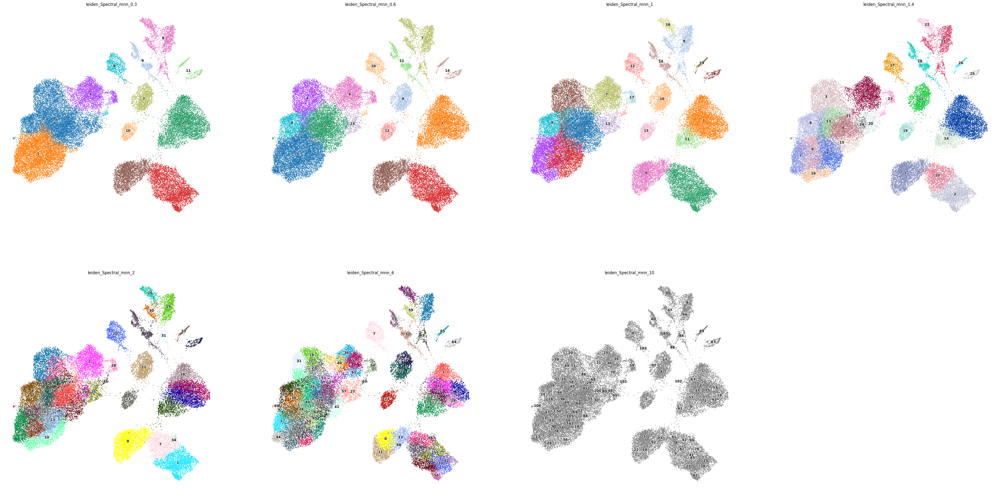

In [29]:
i = 'Spectral_mnn'
plot_list = []
for k in [0.3,0.6,1,1.4,2,6,10]:
    plot_list.append(f'leiden_Spectral_mnn_{k}')
sc.pl.embedding(adata, basis = f'Umap_{i}', color = plot_list, frameon = False, size = 15, legend_loc='on data', show=False, legend_fontoutline=2)


/home/marioam/miniconda3/envs/General_env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/marioam/miniconda3/envs/General_env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/marioam/miniconda3/envs/General_env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


[<Axes: title={'center': 'Manual_Annotation_l1'}, xlabel='Umap_Spectral_mnn1', ylabel='Umap_Spectral_mnn2'>,
 <Axes: title={'center': 'Manual_Annotation_l1_snRNA'}, xlabel='Umap_Spectral_mnn1', ylabel='Umap_Spectral_mnn2'>,
 <Axes: title={'center': 'Manual_Annotation_l2_snRNA'}, xlabel='Umap_Spectral_mnn1', ylabel='Umap_Spectral_mnn2'>]

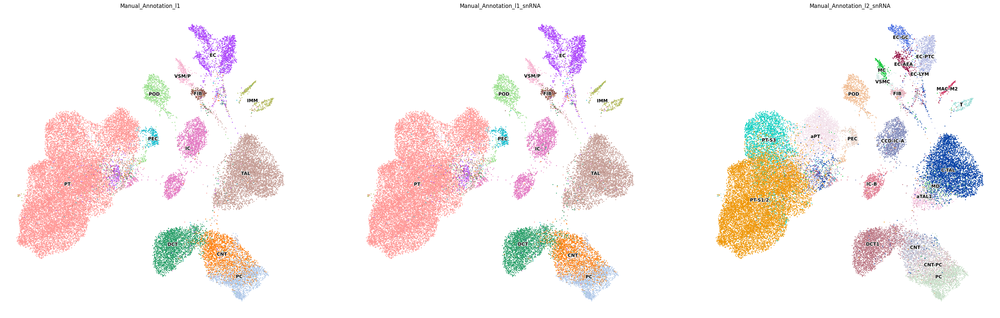

In [23]:

sc.pl.embedding(adata, basis = f'Umap_Spectral_mnn', color = ['Manual_Annotation_l1','Manual_Annotation_l1_snRNA','Manual_Annotation_l2_snRNA'], frameon = False, size = 15, legend_loc='on data', show=False, legend_fontoutline=2)


In [15]:
counts = adata.obs.groupby('Manual_Annotation_l1_snRNA')['leiden_Spectral_mnn_6'].value_counts()

# Step 2: Unstack to create a DataFrame
percentages = counts.groupby(level=1).apply(lambda x: 100 * x / float(x.sum()))

# Step 2: Unstack to create a DataFrame
percentages_df = percentages.unstack(fill_value=0).T
most_abundant = percentages_df.apply(lambda x: pd.Series([x.max(), x.idxmax()], index=['Max_Percentage', 'Most_Abundant_Cell_Type']), axis=1)

# Step 2: Set the Leiden clusters as the index
most_abundant.index.name = 'Leiden_Cluster'
most_abundant.reset_index(inplace=True)
# most_abundant = most_abundant[~most_abundant['Most_Abundant_Cell_Type'].isin(present_ct)]
# most_abundant = most_abundant[most_abundant['Max_Percentage'] > 60]
ann_l1_dict = {}
for i in most_abundant.index:
    ann_l1_dict[most_abundant.loc[i,'Leiden_Cluster']] = most_abundant.loc[i,'Most_Abundant_Cell_Type']

/tmp/ipykernel_10647/4076883111.py:4: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  percentages = counts.groupby(level=1).apply(lambda x: 100 * x / float(x.sum()))


/home/marioam/miniconda3/envs/General_env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/marioam/miniconda3/envs/General_env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


[<Axes: title={'center': 'Manual_Annotation_l1'}, xlabel='Umap_Spectral_mnn1', ylabel='Umap_Spectral_mnn2'>,
 <Axes: title={'center': 'Manual_Annotation_l1_snATAC'}, xlabel='Umap_Spectral_mnn1', ylabel='Umap_Spectral_mnn2'>]

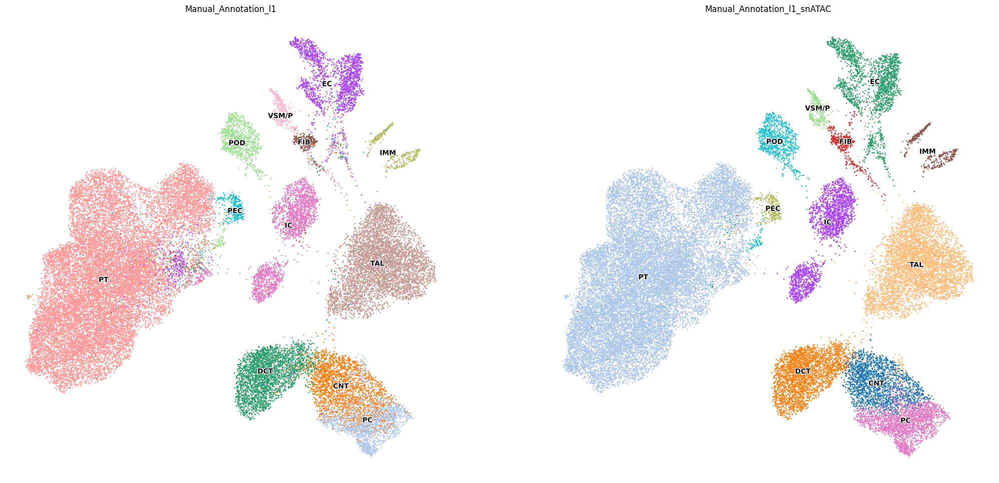

In [21]:
adata.obs['Manual_Annotation_l1_snATAC'] = [ann_l1_dict[i] for i in adata.obs['leiden_Spectral_mnn_6']]
adata.obs.loc[adata[adata.obs['leiden_Spectral_mnn_0.3'].isin(['0'])].obs.index,'Manual_Annotation_l1_snATAC'] = 'PT'
adata.obs.loc[adata[adata.obs['leiden_Spectral_mnn_1.4'].isin(['20'])].obs.index,'Manual_Annotation_l1_snATAC'] = 'PT'

sc.pl.embedding(adata, basis = f'Umap_Spectral_mnn', color = ['Manual_Annotation_l1','Manual_Annotation_l1_snATAC'], frameon = False, size = 15, legend_loc='on data', show=False, legend_fontoutline=2)

In [40]:
counts = adata.obs.groupby('Manual_Annotation_l2_snRNA')['leiden_Spectral_mnn_20'].value_counts()

# Step 2: Unstack to create a DataFrame
percentages = counts.groupby(level=1).apply(lambda x: 100 * x / float(x.sum()))

# Step 2: Unstack to create a DataFrame
percentages_df = percentages.unstack(fill_value=0).T
most_abundant = percentages_df.apply(lambda x: pd.Series([x.max(), x.idxmax()], index=['Max_Percentage', 'Most_Abundant_Cell_Type']), axis=1)

# Step 2: Set the Leiden clusters as the index
most_abundant.index.name = 'Leiden_Cluster'
most_abundant.reset_index(inplace=True)
# most_abundant = most_abundant[~most_abundant['Most_Abundant_Cell_Type'].isin(present_ct)]
# most_abundant = most_abundant[most_abundant['Max_Percentage'] > 60]
ann_l2_dict = {}
for i in most_abundant.index:
    ann_l2_dict[most_abundant.loc[i,'Leiden_Cluster']] = most_abundant.loc[i,'Most_Abundant_Cell_Type']

/tmp/ipykernel_10647/760814590.py:4: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  percentages = counts.groupby(level=1).apply(lambda x: 100 * x / float(x.sum()))


/home/marioam/miniconda3/envs/General_env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/marioam/miniconda3/envs/General_env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


[<Axes: title={'center': 'Manual_Annotation_l2'}, xlabel='Umap_Spectral_mnn1', ylabel='Umap_Spectral_mnn2'>,
 <Axes: title={'center': 'Manual_Annotation_l2_snATAC'}, xlabel='Umap_Spectral_mnn1', ylabel='Umap_Spectral_mnn2'>]

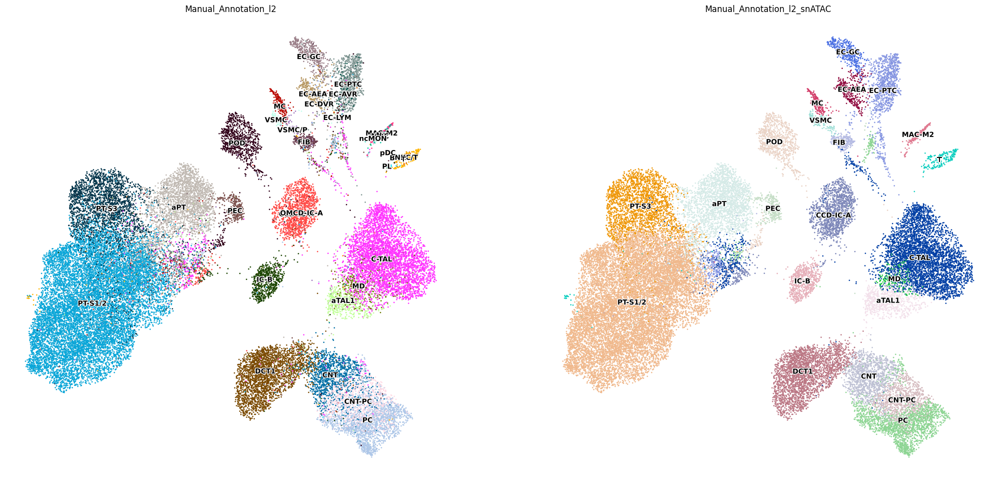

In [41]:
adata.obs['Manual_Annotation_l2_snATAC'] = [ann_l2_dict[i] for i in adata.obs['leiden_Spectral_mnn_20']]
# adata.obs.loc[adata[adata.obs['leiden_Spectral_mnn_0.6'].isin(['13'])].obs.index,'Manual_Annotation_l2_snATAC'] = 'PT S1/2'
# adata.obs.loc[adata[adata.obs['leiden_Spectral_mnn_1.4'].isin(['20'])].obs.index,'Manual_Annotation_l1_snATAC'] = 'PT'

sc.pl.embedding(adata, basis = f'Umap_Spectral_mnn', color = ['Manual_Annotation_l2','Manual_Annotation_l2_snATAC'], frameon = False, size = 15, legend_loc='on data', show=False, legend_fontoutline=2)

In [58]:
adata
import seaborn as sns
def comparison_heatmap(adata, key1, key2, label_1=None, label_2=None, cmap = 'Reds', annot = True, figsize=(7,7)):
    if label_1==None:
        label_1=key1
    if label_2==None:
        label_2=key2
    expected_df = adata.obs[[key1,key2]].groupby(by=[key2,key1]).size().reset_index(name = 'count')
    counts = np.array(expected_df['count'].tolist())
    df = pd.DataFrame(counts.reshape(((len(adata.obs[key2].cat.categories),len(adata.obs[key1].cat.categories)))), index = expected_df[key2].unique(), columns = expected_df[key1].unique())
    if annot ==True:
        annot_ = df.astype(int)
        sc.settings.set_figure_params(figsize=figsize, color_map='gist_earth')
    else:
        annot_=None
        sc.settings.set_figure_params(figsize=figsize, color_map='gist_earth')
    s = sns.heatmap(df/np.sum(df,axis = 0), cbar_kws={'label': '% cell shared between annotations',"shrink": .5}, cmap=cmap, vmax=1, vmin=0, annot = annot_,  fmt='.7g',center=0.5,square=True, linewidths=.5)
    s.set_ylabel(label_2, fontsize=12)
    s.set_xlabel(label_1, fontsize = 12)
    return df

,C-TAL,CCD-IC-A,CNT,CNT-PC,DCT1,EC-AEA,EC-GC,EC-LYM,EC-PTC,FIB,...,MD,PC,PEC,POD,PT-S1/2,PT-S3,T,VSMC,aPT,aTAL1
C-TAL,4286,29,13,6,53,5,0,0,5,25,...,114,13,4,4,36,9,4,21,13,102
CCD-IC-A,11,1383,9,3,33,0,4,0,0,0,...,0,9,0,7,8,8,2,0,1,6
CNT,2,2,976,166,131,2,3,0,1,0,...,0,67,2,3,2,0,1,0,2,1
CNT-PC,0,1,145,588,1,1,0,0,0,0,...,0,199,1,1,0,0,0,0,2,0
DCT1,16,7,76,2,2536,1,3,0,3,1,...,2,7,7,2,6,0,1,0,2,13
EC-AEA,0,0,0,0,0,249,16,0,29,0,...,0,0,0,0,0,0,0,1,0,0
EC-GC,0,1,0,0,0,0,392,0,16,0,...,0,0,1,1,0,0,0,1,0,0
EC-PTC,37,6,1,0,9,51,95,9,923,3,...,4,1,7,7,27,5,1,9,5,4
FIB,1,2,1,1,0,0,3,0,3,249,...,0,2,3,0,21,4,2,15,5,3
IC-B,1,1,2,0,2,0,0,0,0,1,...,0,0,0,1,2,0,0,0,0,0


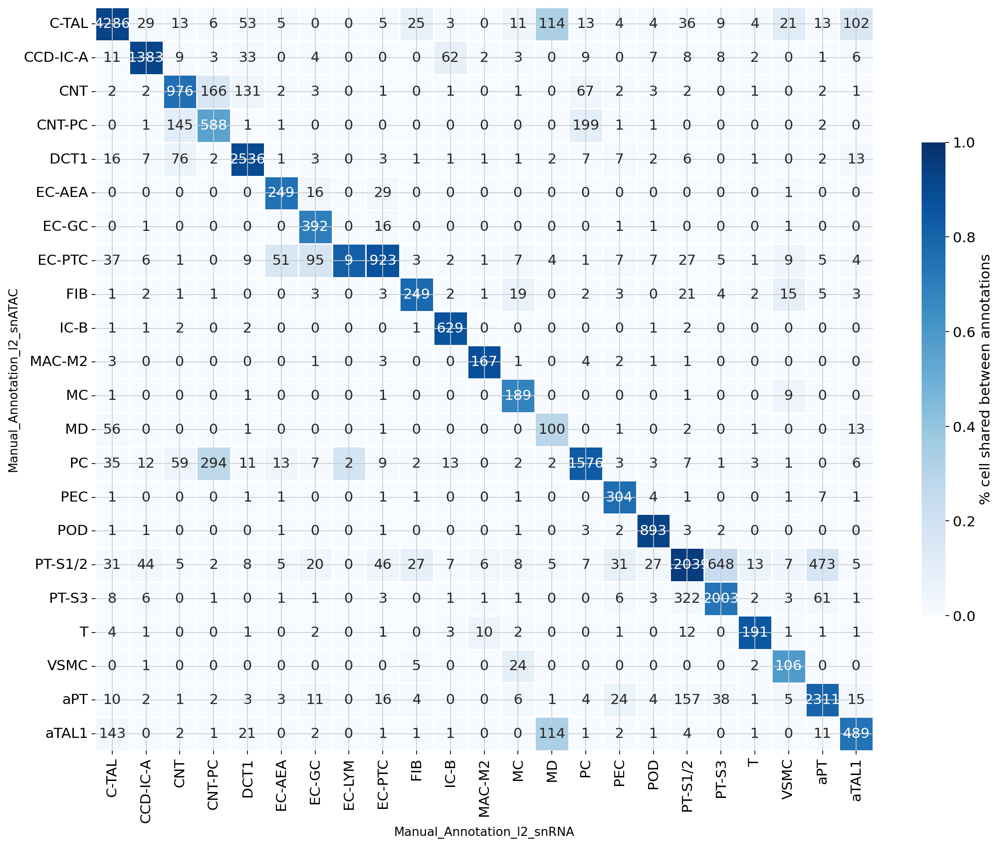

In [59]:
comparison_heatmap(adata, key1 = 'Manual_Annotation_l2_snRNA', key2='Manual_Annotation_l2_snATAC', cmap = 'Blues', figsize=('17', '17'))

,C-TAL,CCD-IC-A,CNT,CNT-PC,DCT1,EC-AEA,EC-GC,EC-LYM,EC-PTC,FIB,...,MD,PC,PEC,POD,PT-S1/2,PT-S3,T,VSMC,aPT,aTAL1
C-TAL,4286,29,13,6,53,5,0,0,5,25,...,114,13,4,4,36,9,4,21,13,102
CCD-IC-A,11,1383,9,3,33,0,4,0,0,0,...,0,9,0,7,8,8,2,0,1,6
CNT,2,2,976,166,131,2,3,0,1,0,...,0,67,2,3,2,0,1,0,2,1
CNT-PC,0,1,145,588,1,1,0,0,0,0,...,0,199,1,1,0,0,0,0,2,0
DCT1,16,7,76,2,2536,1,3,0,3,1,...,2,7,7,2,6,0,1,0,2,13
EC-AEA,0,0,0,0,0,249,16,0,29,0,...,0,0,0,0,0,0,0,1,0,0
EC-GC,0,1,0,0,0,0,392,0,16,0,...,0,0,1,1,0,0,0,1,0,0
EC-PTC,37,6,1,0,9,51,95,9,923,3,...,4,1,7,7,27,5,1,9,5,4
FIB,1,2,1,1,0,0,3,0,3,249,...,0,2,3,0,21,4,2,15,5,3
IC-B,1,1,2,0,2,0,0,0,0,1,...,0,0,0,1,2,0,0,0,0,0


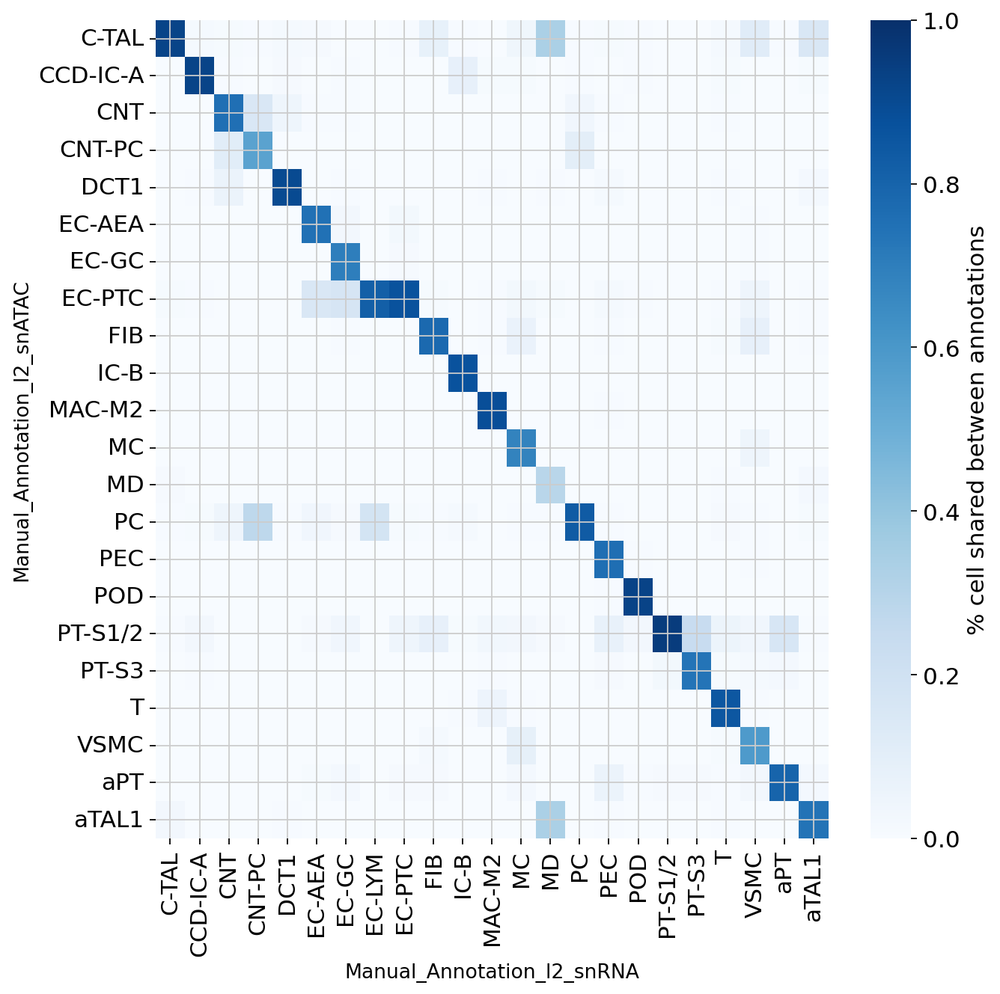

In [52]:
comparison_heatmap(adata, key1 = 'Manual_Annotation_l2_snRNA', key2='Manual_Annotation_l2_snATAC', cmap = 'Blues', figsize=('9', '9'), annot=False)

In [61]:
adata.write('objects/atac_multi.h5ad', compression='gzip')